In [1]:
# Dependencies, install via the req.txt / readme file

%matplotlib inline
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from pandas.plotting import parallel_coordinates
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [2]:
# Ignore warnings for less clutter
import warnings
warnings.filterwarnings('ignore')

In [6]:
# Read in the data from a csv file
df = pd.read_csv(r"data/iris.csv")
df

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sepal_length  150 non-null    float64
 1   sepal_width   150 non-null    float64
 2   petal_length  150 non-null    float64
 3   petal_width   150 non-null    float64
 4   species       150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


In [8]:
df.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


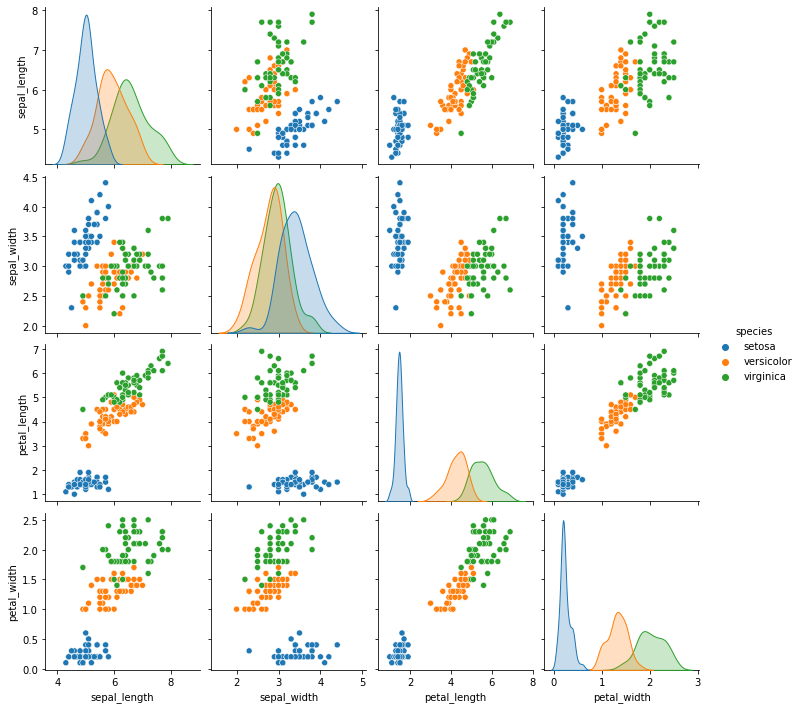

In [9]:
sns.pairplot(df, hue="species")

In [10]:
profile = ProfileReport(df, title='Iris Dataset Example', explorative=True)

In [11]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/18 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [41]:
# profile.to_file("iris_dataset_report.html")

In [13]:
# train-test-split returns 4 variables, provided (features, target, percentage of test)

X_train, X_test, y_train, y_test = train_test_split(df[['sepal_length', 'sepal_width', 'petal_length', 'petal_width']], df[['species']], test_size = 0.1, stratify = df['species'], random_state = 42)

In [14]:
fn = ["sepal_length", "sepal_width", "petal_length", "petal_width"]
cn = ['setosa', 'versicolor', 'virginica']

In [15]:
# Instantiating / creating a machine learning classifier (estimator) / regressor
mod_dt = DecisionTreeClassifier(max_depth = 3, random_state = 1)

# Fit is the training of the machine learning algorithm
mod_dt.fit(X_train,y_train)

# Making predictions on the test set, so we can measure accuracy
prediction = mod_dt.predict(X_test)
print('The accuracy of the Decision Tree is',"{:.3f}".format(metrics.accuracy_score(prediction,y_test)))

The accuracy of the Decision Tree is 0.933


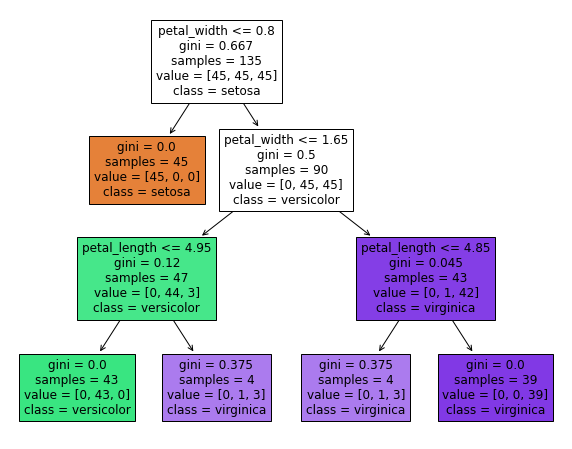

In [16]:
plt.figure(figsize = (10,8))
plot_tree(mod_dt, feature_names = fn, class_names = cn, filled = True);

In [17]:
# Try GaussianNB
mod_GNB = GaussianNB()
mod_GNB.fit(X_train, y_train)
prediction = mod_GNB.predict(X_test)
print('The accuracy of the GaussianNB is',"{:.3f}".format(metrics.accuracy_score(prediction, y_test)))

The accuracy of the GaussianNB is 0.867


In [18]:
# Try SVM
mod_SVM = svm.SVC()
mod_SVM.fit(X_train, y_train)
prediction = mod_SVM.predict(X_test)
print('The accuracy of the SVM is',"{:.3f}".format(metrics.accuracy_score(prediction,y_test)))

The accuracy of the SVM is 0.933


In [19]:
# Example of overfitting
mod_KNN = KNeighborsClassifier()
mod_KNN.fit(X_train, y_train)
prediction = mod_KNN.predict(X_test)
print('The accuracy of the KNN is',"{:.3f}".format(metrics.accuracy_score(prediction, y_test)))

The accuracy of the KNN is 1.000


In [20]:
df = pd.read_csv("data/housing.csv")

In [21]:
df

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [22]:
df.describe()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


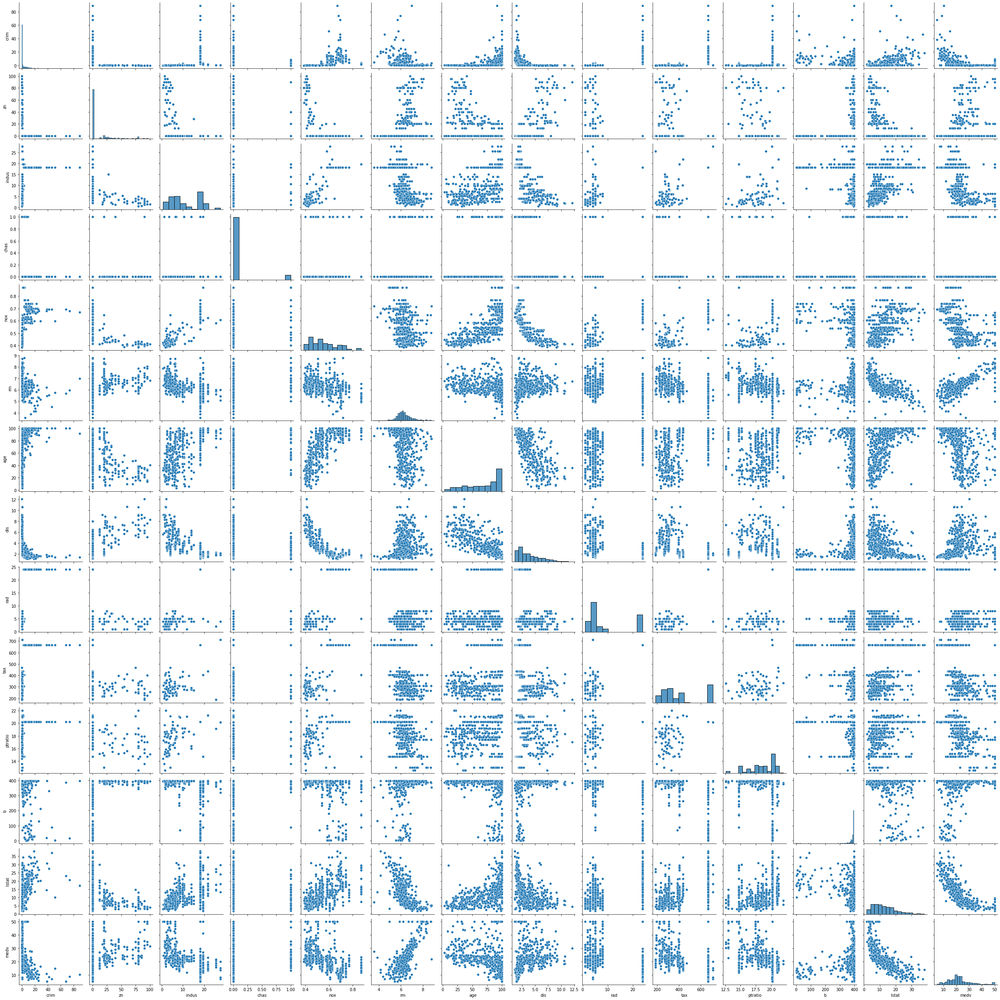

In [23]:
sns.pairplot(df)

In [24]:
profile = ProfileReport(df, title="Housing Market Dataset", explorative=True)

In [ ]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [93]:
# profile.to_file("housing_dataset_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
data = df[['rm']]
target = df[['medv']]

In [28]:
X_train, X_test, y_train, y_test = train_test_split(data, target, test_size = 0.2, random_state=5)

In [29]:
mod_REG = LinearRegression()
mod_REG.fit(X_train, y_train)

predictions = mod_REG.predict(X_train)
rmse = (np.sqrt(mean_squared_error(y_train, predictions)))
r2 = round(mod_REG.score(X_train, y_train), 2)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))
print("\n")

The model performance for training set
--------------------------------------
RMSE is 6.972277149440585
R2 score is 0.43




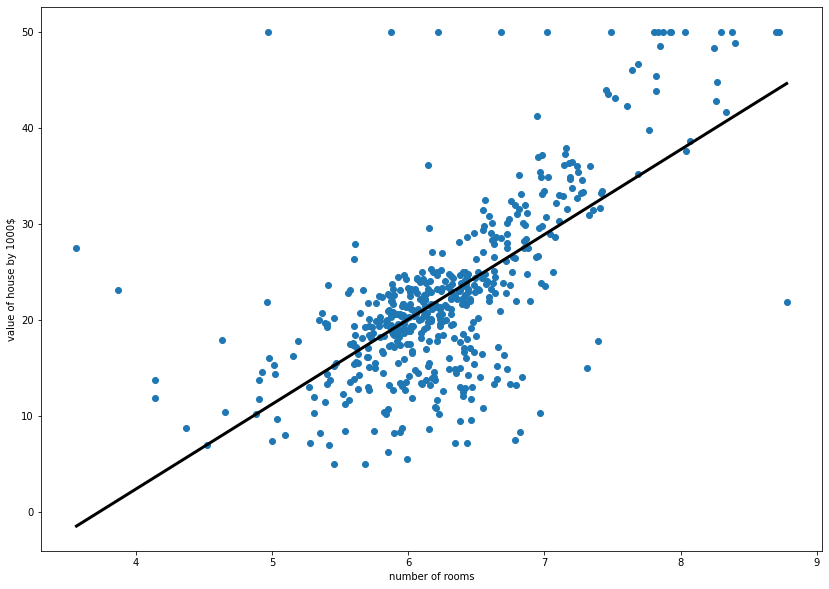

In [32]:
plt.figure(figsize = (14,10))
prediction_space = np.linspace(min(data.to_numpy()), max(data.to_numpy())).reshape(-1,1) 
plt.scatter(data, target)
plt.plot(prediction_space, mod_REG.predict(prediction_space), color = 'black', linewidth = 3)
plt.ylabel('value of house by 1000$')
plt.xlabel('number of rooms')
plt.show()